<a href="https://colab.research.google.com/github/shilpadhananjayan/Projects/blob/main/Landslide_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [9]:
import geopandas as gpd
import pandas as pd
import requests
from shapely.geometry import shape
import matplotlib.pyplot as plt
import folium

landslide_url = "https://data.sfgov.org/resource/bna4-itif.geojson"
nhood_url     = "https://data.sfgov.org/resource/j2bu-swwd.geojson"

gdf_landslide = gpd.read_file(landslide_url)
gdf_neigh = gpd.read_file(nhood_url)


NHOOD_GEOJSON = "https://data.sfgov.org/resource/j2bu-swwd.geojson?$limit=5000"
*Initial attempts to load neighborhood boundaries via the DataSF GeoJSON endpoint returned null geometries in the analysis environment. A fallback using the JSON endpoint and explicit geometry construction was implemented to ensure reliable spatial data ingestion.*

In [10]:
# Quick previews
print("Number of polygons:", len(gdf_landslide))
print("Columns:", list(gdf_landslide.columns))
print("Geometry type:", gdf_landslide.geometry.geom_type.unique())
print("Landslide data rows:", len(gdf_landslide))
print("Neighborhood count:", len(gdf_neigh))


Number of polygons: 8
Columns: ['shape_area', 'gridcode', 'last_edite', 'created_us', 'created_da', 'objectid', 'shape_leng', 'sum_shape_', 'last_edi_1', 'shape_le_1', 'geometry']
Geometry type: ['MultiPolygon']
Landslide data rows: 8
Neighborhood count: 41


In [11]:
# Missing or empty geometries
print("Missing geometries:", gdf_landslide.geometry.isna().sum())
print("Empty geometries:", gdf_landslide.geometry.is_empty.sum())


Missing geometries: 0
Empty geometries: 0


In [12]:
# Validity check
gdf_landslide.geometry.is_valid.value_counts()


,count
False,8


In [13]:
gdf_landslide.isnull().sum()


,0
shape_area,0
gridcode,0
last_edite,8
created_us,8
created_da,8
objectid,0
shape_leng,0
sum_shape_,0
last_edi_1,8
shape_le_1,0


In [14]:
# Number of distinct polygons
gdf_landslide.geometry.nunique()


8

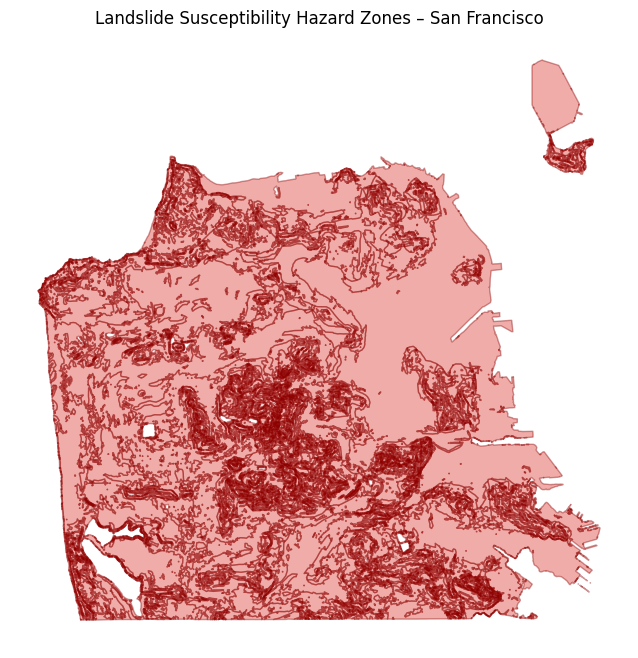

In [15]:
#basic plot

fig, ax = plt.subplots(1, 1, figsize=(8, 8))

gdf_landslide.plot(
    ax=ax,
    color="#d73027",
    edgecolor="darkred",
    alpha=0.4
)

ax.set_title("Landslide Susceptibility Hazard Zones – San Francisco")
ax.axis("off")

plt.show()



Neighborhood layer loads reliably via GeoJSON with 41 MultiPolygon features and valid bounds.

This layer is suitable as a contextual boundary layer for hazard mapping and neighborhood level reporting.

The landslide susceptibility dataset contains a large number of small, fragmented polygons representing localized slope instability. When visualized with filled polygons, these features visually merge, creating the appearance of near continuous coverage. For interpretability, outline only and dissolved representations were used to better communicate spatial patterns and neighborhood context.



In [17]:

# Ensure CRS for Folium
gdf_landslide = gdf_landslide.to_crs(epsg=4326)
gdf_neigh = gdf_neigh.to_crs(epsg=4326)

m = folium.Map(location=[37.77, -122.42], zoom_start=12, tiles="cartodbpositron")

# 1) Landslide zones
folium.GeoJson(
    gdf_landslide,
    name="Landslide Susceptibility Zones",
    style_function=lambda feat: {
        "fillColor": "#d73027",
        "color": "#b30000",
        "weight": 0.6,
        "fillOpacity": 0.1
    }
).add_to(m)

# 2) Neighborhood outlines
folium.GeoJson(
    gdf_neigh,
    name="Neighborhood outlines",
    style_function=lambda feat: {
        "fill": False,
        "color": "#111111",
        "weight": 1,
        "opacity": .5
    }
).add_to(m)



folium.LayerControl(collapsed=False).add_to(m)

# Fit map to SF boundary to always see
#minx, miny, maxx, maxy = sf_boundary.total_bounds
#m.fit_bounds([[miny, minx], [maxy, maxx]])

m


In [18]:
# Neighborhood area
gdf_neigh["nhood_area_km2"] = gdf_neigh.geometry.area / 1e6

# Intersection of landslide zones with neighborhoods
intersection = gpd.overlay(
    gdf_neigh[["nhood", "geometry"]],
    gdf_landslide[["geometry"]],
    how="intersection"
)

intersection["landslide_area_km2"] = intersection.geometry.area / 1e6

# Aggregate by neighborhood
agg = (
    intersection.groupby("nhood", as_index=False)["landslide_area_km2"]
    .sum()
)

# Join back to neighborhoods
gdf_neigh = gdf_neigh.merge(agg, on="nhood", how="left")
gdf_neigh["landslide_area_km2"] = gdf_neigh["landslide_area_km2"].fillna(0)

# Risk proxy (%)
gdf_neigh["landslide_pct"] = (
    gdf_neigh["landslide_area_km2"] / gdf_neigh["nhood_area_km2"]
) * 100

gdf_neigh.sort_values("landslide_pct", ascending=False).head(10)


/tmp/ipython-input-419938696.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_neigh["nhood_area_km2"] = gdf_neigh.geometry.area / 1e6
/usr/local/lib/python3.12/dist-packages/geopandas/tools/overlay.py:358: UserWarning: `keep_geom_type=True` in overlay resulted in 274 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  result = _collection_extract(result, geom_type, keep_geom_type_warning)
/tmp/ipython-input-419938696.py:11: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  intersection["landslide_area_km2"] = intersection.geometry.area / 1e6


,nhood,geometry,nhood_area_km2,landslide_area_km2,landslide_pct
28,Japantown,"MULTIPOLYGON (((-122.42469 37.78534, -122.4249...",3.197504e-11,3.197504e-11,100.0
37,Chinatown,"MULTIPOLYGON (((-122.40623 37.79756, -122.4055...",5.952493e-11,5.952493e-11,100.0
30,Hayes Valley,"MULTIPOLYGON (((-122.42081 37.774, -122.42109 ...",1.299074e-10,1.299074e-10,100.0
20,Nob Hill,"MULTIPOLYGON (((-122.41147 37.79506, -122.4113...",1.077980e-10,1.077980e-10,100.0
16,Noe Valley,"MULTIPOLYGON (((-122.42553 37.75655, -122.4253...",2.584957e-10,2.584957e-10,100.0
0,Western Addition,"MULTIPOLYGON (((-122.42144 37.78557, -122.4213...",1.545620e-10,1.545620e-10,100.0
10,Pacific Heights,"MULTIPOLYGON (((-122.42349 37.79561, -122.4233...",2.107034e-10,2.107034e-10,100.0
33,Inner Richmond,"MULTIPOLYGON (((-122.45932 37.78752, -122.4592...",1.971211e-10,1.971211e-10,100.0
31,Haight Ashbury,"MULTIPOLYGON (((-122.432 37.77143, -122.4319 3...",1.474685e-10,1.474685e-10,100.0
17,Lone Mountain/USF,"MULTIPOLYGON (((-122.44269 37.78264, -122.4418...",1.534555e-10,1.534555e-10,100.0


Neighborhood risk is visualized using a continuous gradient based on the percentage of neighborhood area classified as landslide susceptible, providing a relative comparison rather than discrete risk thresholds.

In [19]:
import folium


gdf_neigh_web = gdf_neigh.to_crs(epsg=4326)

# Create risk bands
gdf_neigh_web["risk_band_fine"] = pd.qcut(
    gdf_neigh_web["landslide_pct"],
    q=8,
    labels=[
        "Very Low",
        "Low",
        "Low–Medium",
        "Medium",
        "Medium–High",
        "High",
        "Very High",
        "Extreme"
    ]
)

m = folium.Map(location=[37.77, -122.42], zoom_start=12, tiles="cartodbpositron")

folium.Choropleth(
    geo_data=gdf_neigh_web,
    data=gdf_neigh_web,
    columns=["nhood", "landslide_pct"],
    key_on="feature.properties.nhood",
    fill_color="BuPu",
    bins=8,
    fill_opacity=.8,
    line_opacity=0.5,
    legend_name="Landslide Susceptibility Coverage (%)"
).add_to(m)

# Add neighborhood borders
folium.GeoJson(
    gdf_neigh_web,
    style_function=lambda f: {
        "fill": False,
        "color": "#111",
        "weight": .5
    },
    tooltip=folium.GeoJsonTooltip(
        fields=["nhood", "landslide_pct", "risk_band_fine"],
        aliases=["Neighborhood", "Landslide Coverage (%)", "Risk Band"],
        localize=True
    )
).add_to(m)

m

Landslide data with agrregated data for each neighbourhood. Neighborhood risk is visualized using a continuous gradient based on the percentage of neighborhood area classified as landslide susceptible, providing a relative comparison rather than discrete risk thresholds.